In [3]:
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import os
import pandas as pd

import scvelo as scv
#import cellrank as cr
import anndata as ad

scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=150, frameon=False)
#cr.settings.verbosity = 2

In [2]:
## Step 0: Load Full SC data

In [3]:
# load sparse matrix:
X = io.mmread("/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.full.counts_mtx.gz")

In [4]:
# create anndata object
adata = anndata.AnnData(
    X=X.transpose().tocsr()
)

In [5]:
# load cell metadata:
cell_meta = pd.read_csv("/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.full.srt_meta.csv.gz",
                        compression='gzip')


In [6]:
# load gene names:
with open("/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.full.gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()
gene_names.pop(0)

'rownames(full.srt)'

In [7]:
# set anndata observations and index obs by barcodes, var by gene names
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

In [8]:
# load dimensional reduction:
pca = pd.read_csv("/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.full_scVI.srt_dim.csv.gz",
                 compression='gzip')
pca.index = adata.obs.index

In [9]:
# set pca and umap
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T
adata.obsm['X_subumap'] = np.vstack((adata.obs['SUBUMAP_1'].to_numpy(), adata.obs['SUBUMAP_2'].to_numpy())).T
adata.obsm['X_mainumap'] = np.vstack((adata.obs['MAINUMAP_1'].to_numpy(), adata.obs['MAINUMAP_2'].to_numpy())).T

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


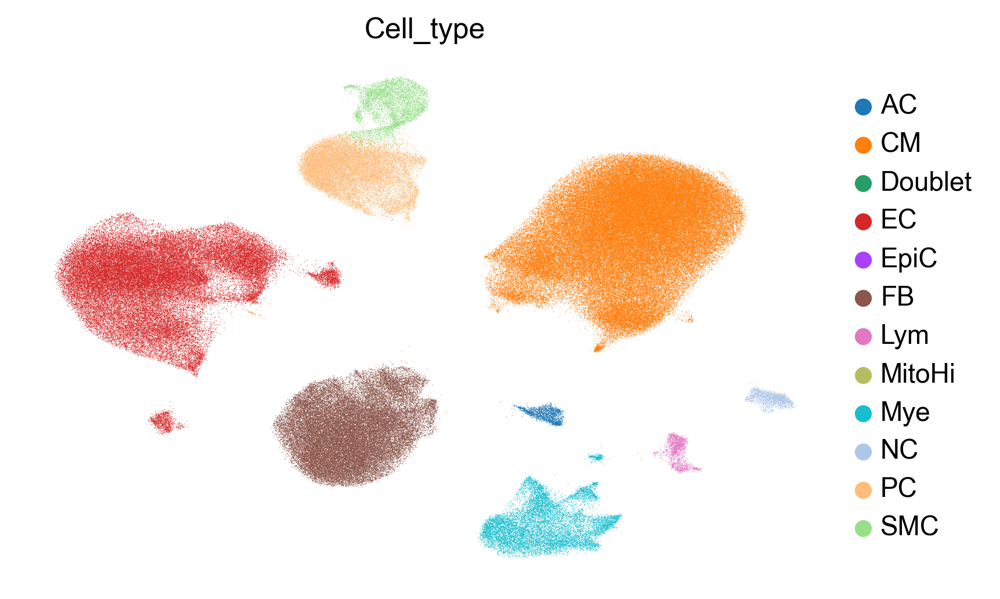

In [10]:
# plot a UMAP colored by sampleID to test:
sc.pl.umap(adata, color=['Cell_type'], frameon=False)

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


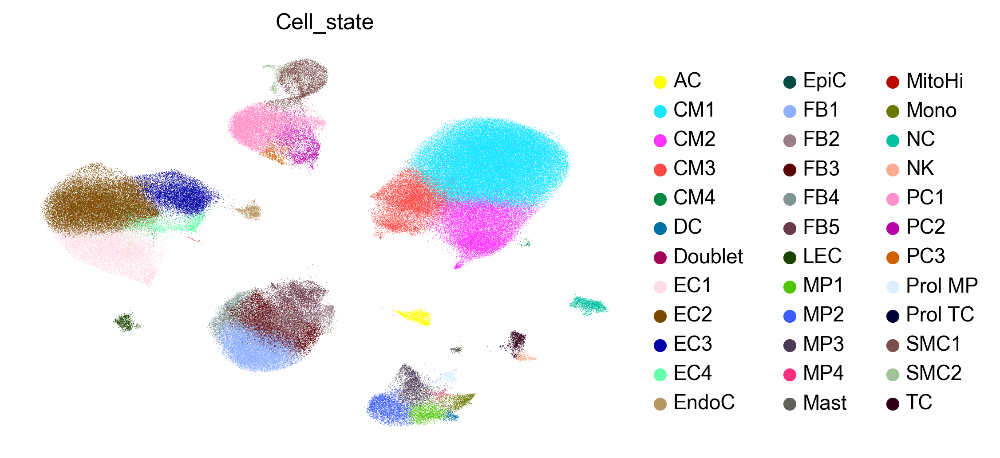

In [11]:
sc.pl.umap(adata, color=['Cell_state'], frameon=False)

In [12]:
# save dataset as anndata format
adata.write('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/tmp/PART24.full_scvelo.h5ad')

In [13]:
# reload dataset
# adata = sc.read_h5ad('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/tmp/PART24.full_scvelo.h5ad')

In [14]:
## Step 1: Load Velocyto data

In [15]:
# load loom files for spliced/unspliced matrices for each sample:
path1="/Volumes/shire/data/scrnaseq/"
path2="matrix/velocyto/"
Ctrl_01_loom_data1 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s1.loom")
Ctrl_01_loom_data2 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s2.loom")
Ctrl_01_loom_data3 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s3.loom")
Ctrl_02_loom_data1 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s8.loom")
Ctrl_02_loom_data2 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s9.loom")
Ctrl_02_loom_data3 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s10.loom")
Ctrl_03_loom_data = scv.read(path1+"2021_Circulation_EPorrello/"+path2+"2021_Circulation_EPorrello_Y2.loom")
Ctrl_04_loom_data1 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s4.loom")
Ctrl_04_loom_data2 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s5.loom")
Ctrl_04_loom_data3 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s11.loom")
Ctrl_04_loom_data4 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s12.loom")
Ctrl_05_loom_data1 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s6.loom")
Ctrl_05_loom_data2 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s7.loom")
Ctrl_06_loom_data = scv.read(path1+"2021_Circulation_EPorrello/"+path2+"2021_Circulation_EPorrello_Y3.loom")
HLHS_01_loom_data = scv.read(path1+"2022_Unpub3_DTuraga/"+path2+"2022_Unpub3_DTuraga_P184.loom")
HLHS_02_loom_data = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_hlhs_s2.loom")
HLHS_03_loom_data = scv.read(path1+"2022_Unpub3_DTuraga/"+path2+"2022_Unpub3_DTuraga_P179.loom")
HLHS_04_loom_data = scv.read(path1+"2022_Unpub4_DTuraga/"+path2+"2022_Unpub4_DTuraga_P81.loom")
HLHS_05_loom_data1 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_hlhs_s3.loom")
HLHS_05_loom_data2 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_hlhs_s4.loom")
HLHS_06_loom_data1 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_htx_s1.loom")
HLHS_06_loom_data2 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_htx_s2.loom")
HLHS_07_loom_data = scv.read(path1+"2022_Unpub5_DTuraga/"+path2+"2022_Unpub5_DTuraga_P70.loom")
HLHS_08_loom_data = scv.read(path1+"2022_Unpub5_DTuraga/"+path2+"2022_Unpub5_DTuraga_P175.loom")
HLHS_09_loom_data = scv.read(path1+"2022_Unpub3_DTuraga/"+path2+"2022_Unpub3_DTuraga_P181.loom")
HLHS_10_loom_data = scv.read(path1+"2022_Unpub5_DTuraga/"+path2+"2022_Unpub5_DTuraga_P151.loom")
HLHS_11_loom_data = scv.read(path1+"2022_Unpub5_DTuraga/"+path2+"2022_Unpub5_DTuraga_P157.loom")
HLHS_12_loom_data = scv.read(path1+"2021_Unpub1_DTuraga/"+path2+"2021_Unpub1_DTuraga_P93_s1.loom")
HLHS_13_loom_data = scv.read(path1+"2022_Unpub5_DTuraga/"+path2+"2022_Unpub5_DTuraga_P163.loom")


/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages

In [16]:
## Rename all loom cell names to match the adata
barcodes = [bc.split(':')[1] for bc in Ctrl_01_loom_data1.obs.index.tolist()]
Ctrl_01_loom_data1.index = [bc[0:len(bc)-1] + '_1' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_01_loom_data2.obs.index.tolist()]
Ctrl_01_loom_data2.index = [bc[0:len(bc)-1] + '_2' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_01_loom_data3.obs.index.tolist()]
Ctrl_01_loom_data3.index = [bc[0:len(bc)-1] + '_3' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_02_loom_data1.obs.index.tolist()]
Ctrl_02_loom_data1.index = [bc[0:len(bc)-1] + '_4' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_02_loom_data2.obs.index.tolist()]
Ctrl_02_loom_data2.index = [bc[0:len(bc)-1] + '_5' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_02_loom_data3.obs.index.tolist()]
Ctrl_02_loom_data3.index = [bc[0:len(bc)-1] + '_6' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_03_loom_data.obs.index.tolist()]
Ctrl_03_loom_data.index = [bc[0:len(bc)-1] + '_7' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_04_loom_data1.obs.index.tolist()]
Ctrl_04_loom_data1.index = [bc[0:len(bc)-1] + '_8' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_04_loom_data2.obs.index.tolist()]
Ctrl_04_loom_data2.index = [bc[0:len(bc)-1] + '_9' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_04_loom_data3.obs.index.tolist()]
Ctrl_04_loom_data3.index = [bc[0:len(bc)-1] + '_10' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_04_loom_data4.obs.index.tolist()]
Ctrl_04_loom_data4.index = [bc[0:len(bc)-1] + '_11' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_05_loom_data1.obs.index.tolist()]
Ctrl_05_loom_data1.index = [bc[0:len(bc)-1] + '_12' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_05_loom_data2.obs.index.tolist()]
Ctrl_05_loom_data2.index = [bc[0:len(bc)-1] + '_13' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_06_loom_data.obs.index.tolist()]
Ctrl_06_loom_data.index = [bc[0:len(bc)-1] + '_14' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_01_loom_data.obs.index.tolist()]
HLHS_01_loom_data.index = [bc[0:len(bc)-1] + '_15' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_02_loom_data.obs.index.tolist()]
HLHS_02_loom_data.index = [bc[0:len(bc)-1] + '_16' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_03_loom_data.obs.index.tolist()]
HLHS_03_loom_data.index = [bc[0:len(bc)-1] + '_17' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_04_loom_data.obs.index.tolist()]
HLHS_04_loom_data.index = [bc[0:len(bc)-1] + '_18' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_05_loom_data1.obs.index.tolist()]
HLHS_05_loom_data1.index = [bc[0:len(bc)-1] + '_19' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_05_loom_data2.obs.index.tolist()]
HLHS_05_loom_data2.index = [bc[0:len(bc)-1] + '_20' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_06_loom_data1.obs.index.tolist()]
HLHS_06_loom_data1.index = [bc[0:len(bc)-1] + '_21' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_06_loom_data2.obs.index.tolist()]
HLHS_06_loom_data2.index = [bc[0:len(bc)-1] + '_22' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_07_loom_data.obs.index.tolist()]
HLHS_07_loom_data.index = [bc[0:len(bc)-1] + '_23' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_08_loom_data.obs.index.tolist()]
HLHS_08_loom_data.index = [bc[0:len(bc)-1] + '_24' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_09_loom_data.obs.index.tolist()]
HLHS_09_loom_data.index = [bc[0:len(bc)-1] + '_25' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_10_loom_data.obs.index.tolist()]
HLHS_10_loom_data.index = [bc[0:len(bc)-1] + '_26' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_11_loom_data.obs.index.tolist()]
HLHS_11_loom_data.index = [bc[0:len(bc)-1] + '_27' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_12_loom_data.obs.index.tolist()]
HLHS_12_loom_data.index = [bc[0:len(bc)-1] + '_28' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in HLHS_13_loom_data.obs.index.tolist()]
HLHS_13_loom_data.index = [bc[0:len(bc)-1] + '_29' for bc in barcodes]

In [17]:
# make variable names unique
Ctrl_01_loom_data1.var_names_make_unique()
Ctrl_01_loom_data2.var_names_make_unique()
Ctrl_01_loom_data3.var_names_make_unique()
Ctrl_02_loom_data1.var_names_make_unique()
Ctrl_02_loom_data2.var_names_make_unique()
Ctrl_02_loom_data3.var_names_make_unique()
Ctrl_03_loom_data.var_names_make_unique() 
Ctrl_04_loom_data1.var_names_make_unique()
Ctrl_04_loom_data2.var_names_make_unique()
Ctrl_04_loom_data3.var_names_make_unique()
Ctrl_04_loom_data4.var_names_make_unique()
Ctrl_05_loom_data1.var_names_make_unique()
Ctrl_05_loom_data2.var_names_make_unique()
Ctrl_06_loom_data.var_names_make_unique() 
HLHS_01_loom_data.var_names_make_unique() 
HLHS_02_loom_data.var_names_make_unique() 
HLHS_03_loom_data.var_names_make_unique() 
HLHS_04_loom_data.var_names_make_unique() 
HLHS_05_loom_data1.var_names_make_unique()
HLHS_05_loom_data2.var_names_make_unique()
HLHS_06_loom_data1.var_names_make_unique()
HLHS_06_loom_data2.var_names_make_unique()
HLHS_07_loom_data.var_names_make_unique() 
HLHS_08_loom_data.var_names_make_unique() 
HLHS_09_loom_data.var_names_make_unique() 
HLHS_10_loom_data.var_names_make_unique() 
HLHS_11_loom_data.var_names_make_unique() 
HLHS_12_loom_data.var_names_make_unique() 
HLHS_13_loom_data.var_names_make_unique() 

In [18]:
# concatenate the three loom
ldata = Ctrl_01_loom_data1.concatenate([Ctrl_01_loom_data2, Ctrl_01_loom_data3, Ctrl_02_loom_data1, 
                                        Ctrl_02_loom_data2, Ctrl_02_loom_data3, Ctrl_03_loom_data,
                                        Ctrl_04_loom_data1, Ctrl_04_loom_data2, Ctrl_04_loom_data3,
                                        Ctrl_04_loom_data4, Ctrl_05_loom_data1, Ctrl_05_loom_data2, 
                                        Ctrl_06_loom_data, HLHS_01_loom_data, HLHS_02_loom_data,
                                        HLHS_03_loom_data, HLHS_04_loom_data, HLHS_05_loom_data1,
                                        HLHS_05_loom_data2, HLHS_06_loom_data1, HLHS_06_loom_data2,
                                        HLHS_07_loom_data, HLHS_08_loom_data, HLHS_09_loom_data,
                                        HLHS_10_loom_data, HLHS_11_loom_data, HLHS_12_loom_data, 
                                        HLHS_13_loom_data])

In [19]:
# merge matrices into the original adata object
adata = scv.utils.merge(adata, ldata)

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


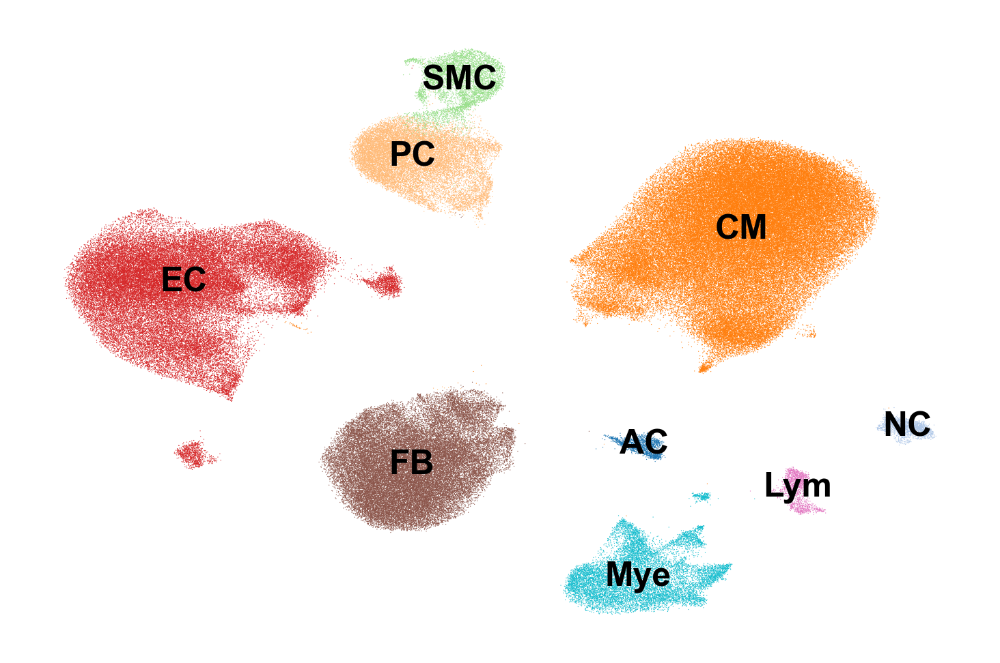

In [20]:
# plot umap to check
sc.pl.umap(adata, color='Cell_type', frameon=False, legend_loc='on data', title='')

In [21]:
## Step 2: Computing RNA velocity using scVelo

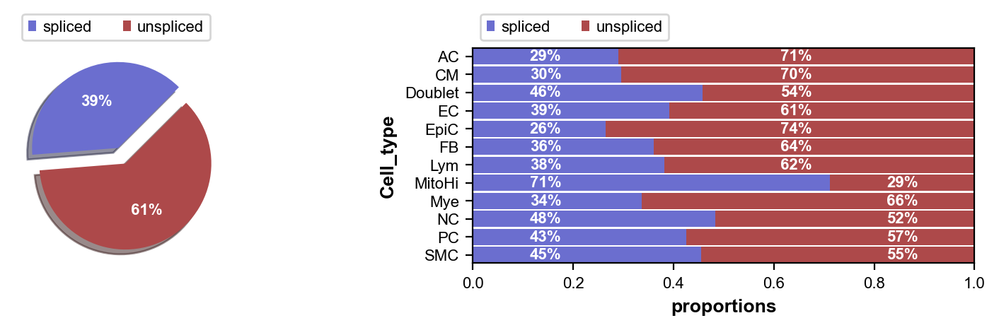

In [22]:
scv.pl.proportions(adata, groupby='Cell_type')

In [23]:
# pre-process
scv.pp.filter_and_normalize(adata)
scv.pp.moments(adata)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:01:06) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:05:46) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [24]:
# save dataset
adata.write('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.full_scvelo.h5ad')

In [25]:
#### End of full data processing ####

In [26]:
#### Analysing Fibroblast subset ####

In [2]:
# reload dataset
adata = sc.read_h5ad('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.full_scvelo.h5ad')

In [28]:
# subset for Fibroblasts
fb_adata = adata[adata.obs['Cell_type'] == 'FB']

In [29]:
fb_adata = fb_adata[fb_adata.obs['Non_ambiguous'] == True]

In [30]:
fb_adata

View of AnnData object with n_obs × n_vars = 42145 × 32251
    obs: 'sample', 'sex', 'age', 'donor', 'group1', 'group2', 'Non_ambiguous', 'Cell_type', 'Cell_state', 'palliation', 'New_name', 'barcode', 'UMAP_1', 'UMAP_2', 'SUBUMAP_1', 'SUBUMAP_2', 'MAINUMAP_1', 'MAINUMAP_2', 'sample_batch', 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr'
    uns: 'Cell_state_colors', 'Cell_type_colors', 'neighbors'
    obsm: 'X_mainumap', 'X_pca', 'X_subumap', 'X_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


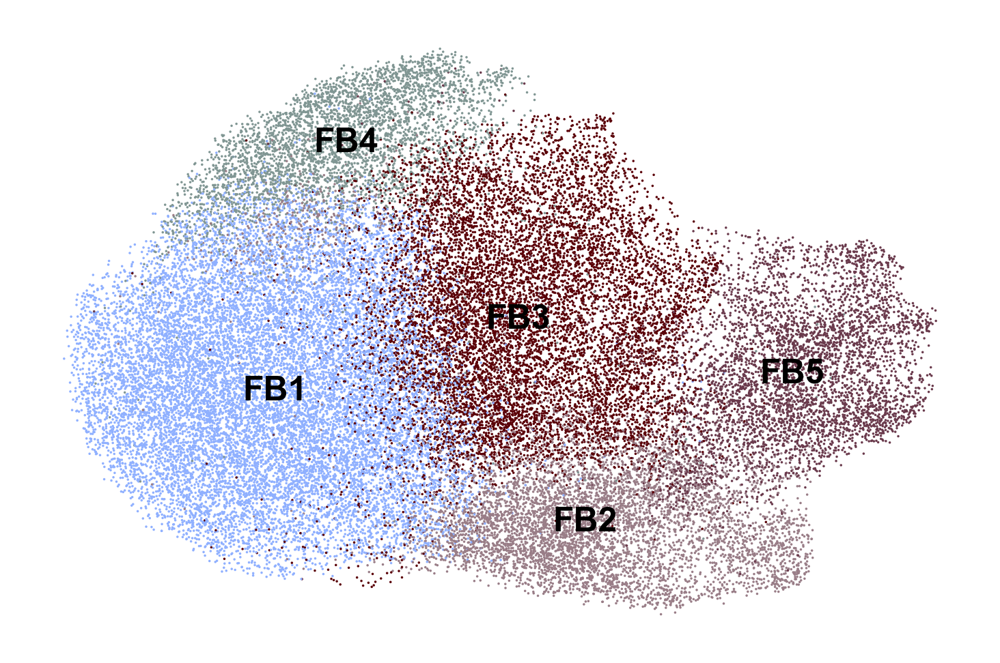

In [31]:
# check dim reduction
sc.pl.embedding(fb_adata, color='Cell_state', frameon=False, legend_loc='on data', title='', basis='subumap')

In [ ]:
# compute velocity using stochastic mode
# scv.tl.velocity(fb_adata, mode = 'stochastic')

# or
# compute velocity using dynamical mode
scv.tl.recover_dynamics(fb_adata, n_jobs = 30)
scv.tl.velocity(fb_adata, mode = 'dynamical')

In [ ]:
scv.pp.neighbors(fb_adata)
scv.tl.velocity_graph(fb_adata)

computing velocity embedding
    finished (0:00:14) --> added
    'velocity_subumap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_fb.scvelo_embedding.pdf


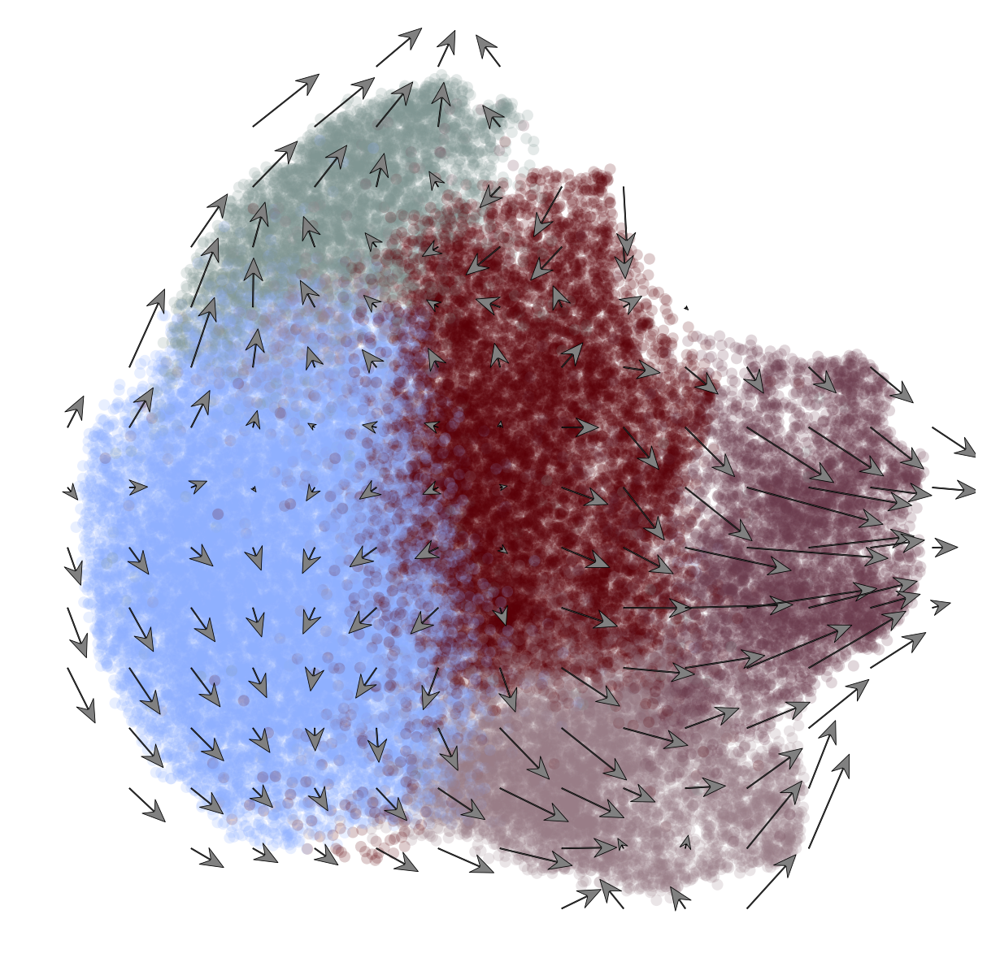

In [34]:
scv.pl.velocity_embedding_grid(fb_adata, basis='subumap', color='Cell_state', title='',
                               scale = 0.2, density = 0.3, smooth = 0.5, min_mass = 5, 
                               arrow_length = 3, arrow_size = 4, linecolor = '##000000',
                               save='fb.scvelo_embedding.pdf', figsize=(5,5))

saving figure to file ./figures/scvelo_fb.embedding_stream.pdf


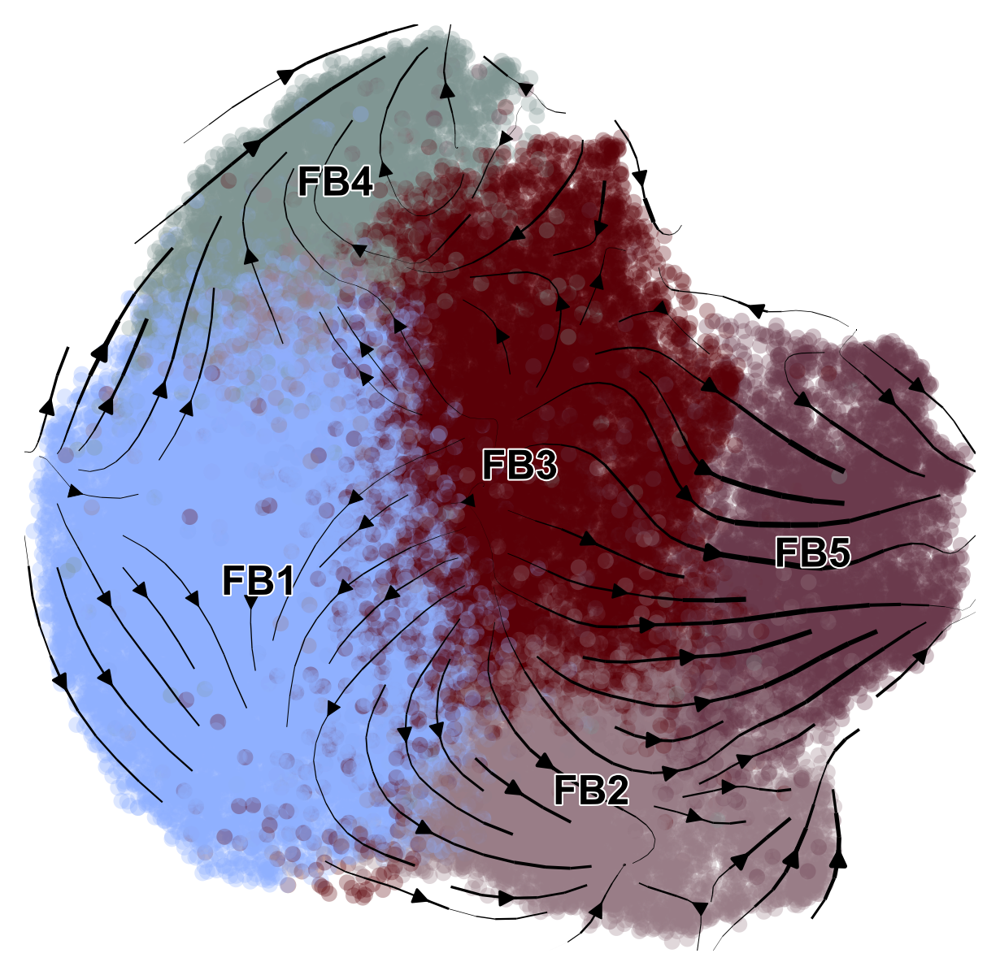

In [35]:
scv.pl.velocity_embedding_stream(fb_adata, basis='subumap', color=['Cell_state'], title='',
                                 min_mass=0.8, density=1,
                                 save='fb.embedding_stream.pdf', figsize=(5,5))

In [37]:
# PAGA analysis
scv.tl.rank_velocity_genes(fb_adata, groupby='Cell_state', min_corr=.3)

ranking velocity genes
    finished (0:04:48) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [38]:
fb_adata.uns['neighbors']['distances'] = fb_adata.obsp['distances']
fb_adata.uns['neighbors']['connectivities'] = fb_adata.obsp['connectivities']
scv.tl.paga(fb_adata, groups='Cell_state', minimum_spanning_tree=1)

computing terminal states
    identified 6 regions of root cells and 1 region of end points .
    finished (0:00:10) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:11) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


In [ ]:
scv.pl.paga(fb_adata, basis='subumap', size=30, alpha=.1, min_edge_width=2, node_size_scale=1.5, threshold=0,
            #save='fb.paga.pdf', figsize=(5,5)
           )

In [ ]:
# latent time
scv.tl.latent_time(fb_adata)

In [41]:
# pseudo time
scv.tl.velocity_pseudotime(fb_adata)

In [50]:
# save dataset
fb_adata.write('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.fb_scvelo.h5ad')

In [51]:
#### End of fibroblast analysis ####

In [52]:
#### Analysing Main Macrophage subset ####

In [53]:
# reload dataset
adata = sc.read_h5ad('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.full_scvelo.h5ad')

In [54]:
# subset for Mono+MP1-3
mp_adata = adata[adata.obs['Cell_state'].isin(['Mono', 'MP1', 'MP2', 'MP3'])]

In [55]:
mp_adata = mp_adata[mp_adata.obs['Non_ambiguous'] == True]

In [56]:
mp_adata

View of AnnData object with n_obs × n_vars = 10576 × 32251
    obs: 'sample', 'sex', 'age', 'donor', 'group1', 'group2', 'Non_ambiguous', 'Cell_type', 'Cell_state', 'palliation', 'New_name', 'barcode', 'UMAP_1', 'UMAP_2', 'SUBUMAP_1', 'SUBUMAP_2', 'MAINUMAP_1', 'MAINUMAP_2', 'sample_batch', 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr'
    uns: 'Cell_state_colors', 'Cell_type_colors', 'neighbors'
    obsm: 'X_mainumap', 'X_pca', 'X_subumap', 'X_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


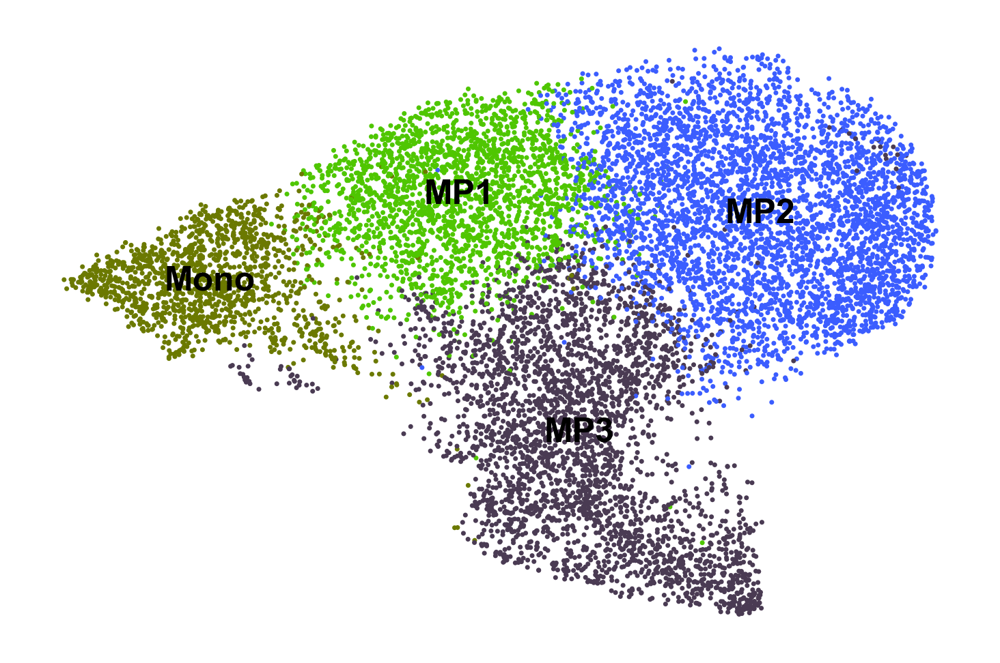

In [57]:
# check dim reduction
sc.pl.embedding(mp_adata, color='Cell_state', frameon=False, legend_loc='on data', title='', basis='mainumap')

In [ ]:
# compute velocity using stochastic mode
#scv.tl.velocity(mp_adata, mode = 'stochastic')

# or
# compute velocity using dynamical mode
scv.tl.recover_dynamics(mp_adata, n_jobs = 30)
scv.tl.velocity(mp_adata, mode = 'dynamical')

In [ ]:
scv.pp.neighbors(mp_adata)
scv.tl.velocity_graph(mp_adata)

computing velocity embedding
    finished (0:00:04) --> added
    'velocity_mainumap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_main_mac.scvelo_embedding.pdf


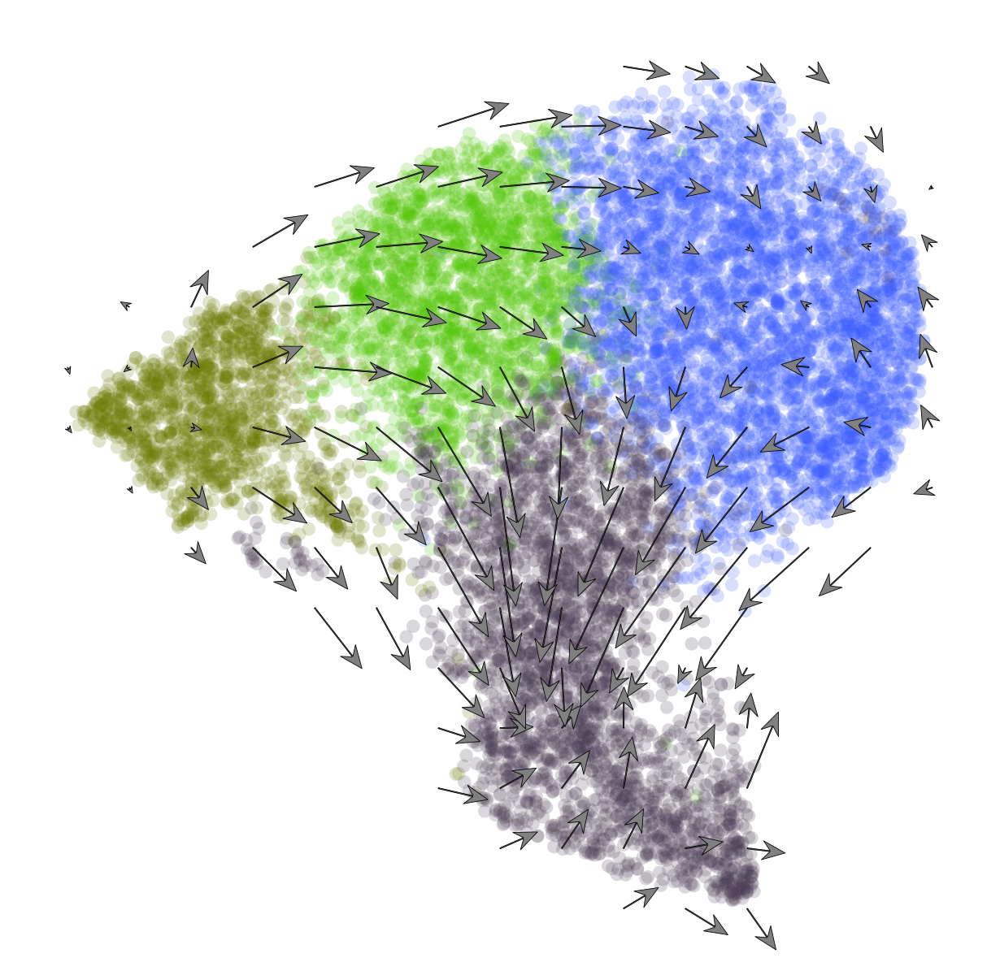

In [60]:
scv.pl.velocity_embedding_grid(mp_adata, basis='mainumap', color='Cell_state', title='',
                               scale = 0.2, density = 0.3, smooth = 0.5, min_mass = 5, 
                               arrow_length = 3, arrow_size = 4, linecolor = '##000000',
                               save='main_mac.scvelo_embedding.pdf', figsize=(5,5))

saving figure to file ./figures/scvelo_main_mac.embedding_stream.pdf


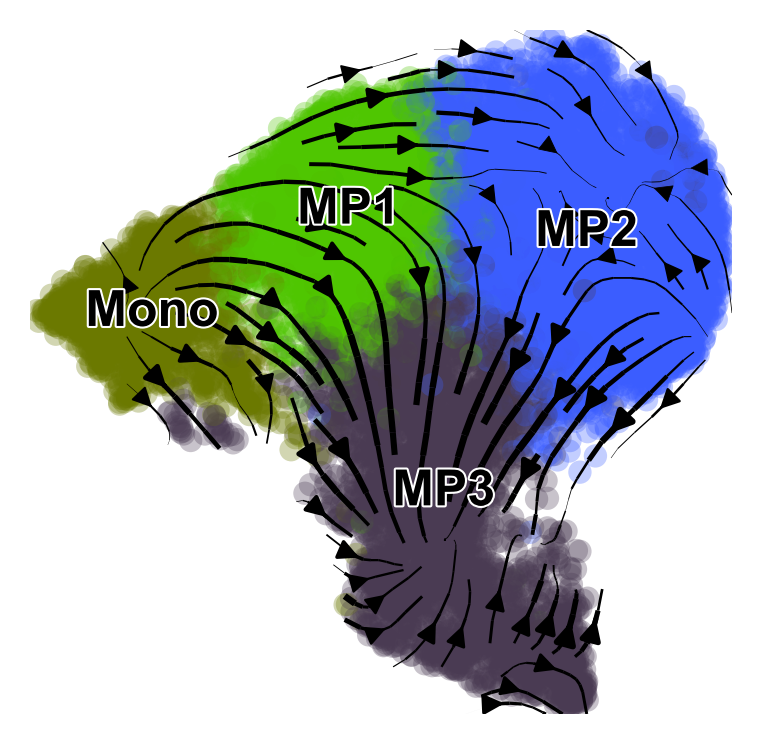

In [61]:
scv.pl.velocity_embedding_stream(mp_adata, basis='mainumap', color=['Cell_state'], title='',
                                 min_mass=0.8, density=1,
                                 save='main_mac.embedding_stream.pdf', figsize=(3,3))

In [63]:
# latent time
scv.tl.latent_time(mp_adata)

computing terminal states
    identified 5 regions of root cells and 1 region of end points .
    finished (0:00:02) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:11) --> added 
    'latent_time', shared time (adata.obs)


In [64]:
# pseudo time
scv.tl.velocity_pseudotime(mp_adata)

In [76]:
# save dataset
mp_adata.write('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.main_mac_scvelo.h5ad')

In [3]:
# subset for Endothelial Cells
ec_adata = adata[adata.obs['Cell_state'].isin(['EC1', 'EC2', 'EC3', 'EC4'])]

In [4]:
ec_adata = ec_adata[ec_adata.obs['Non_ambiguous'] == True]

In [5]:
ec_adata

View of AnnData object with n_obs × n_vars = 52854 × 32251
    obs: 'sample', 'sex', 'age', 'donor', 'group1', 'group2', 'Non_ambiguous', 'Cell_type', 'Cell_state', 'palliation', 'New_name', 'barcode', 'UMAP_1', 'UMAP_2', 'SUBUMAP_1', 'SUBUMAP_2', 'MAINUMAP_1', 'MAINUMAP_2', 'sample_batch', 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr'
    uns: 'Cell_state_colors', 'Cell_type_colors', 'neighbors'
    obsm: 'X_mainumap', 'X_pca', 'X_subumap', 'X_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


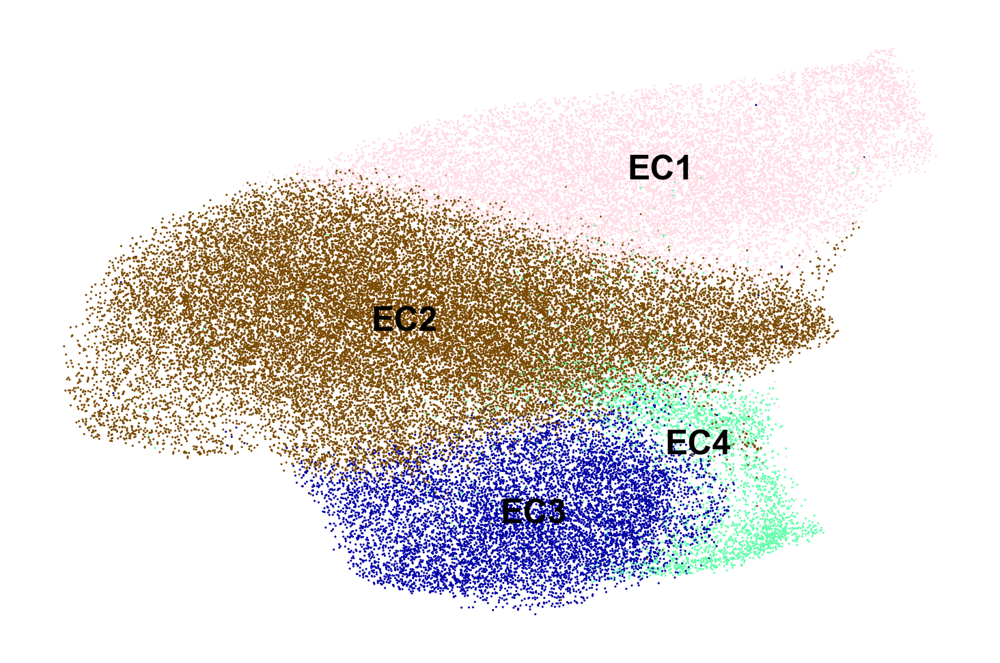

In [6]:
# check dim reduction
sc.pl.embedding(ec_adata, color='Cell_state', frameon=False, legend_loc='on data', title='', basis='mainumap')

In [ ]:
# compute velocity using stochastic mode
# scv.tl.velocity(ec_adata, mode = 'stochastic')

# or
# compute velocity using dynamical mode
scv.tl.recover_dynamics(ec_adata, n_jobs = 30)
scv.tl.velocity(ec_adata, mode = 'dynamical')

In [ ]:
scv.pp.neighbors(ec_adata)
scv.tl.velocity_graph(ec_adata)

computing velocity embedding
    finished (0:00:18) --> added
    'velocity_mainumap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_ec.scvelo_embedding.pdf


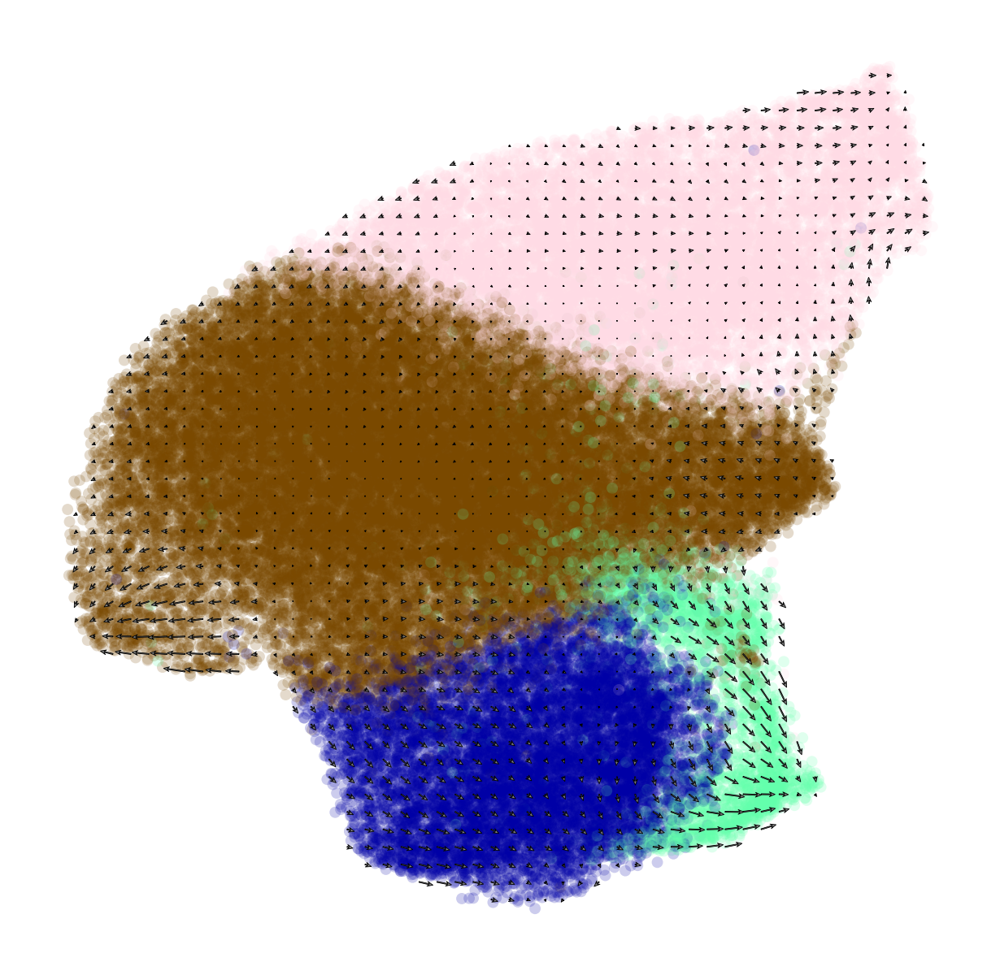

In [9]:
scv.pl.velocity_embedding_grid(ec_adata, basis='mainumap', color='Cell_state', title='',
                               scale = 1, density = 1, smooth = 0.5, min_mass = 5, 
                               arrow_length = 1, arrow_size = 1, linecolor = '##000000',
                               save='ec.scvelo_embedding.pdf', figsize=(5,5))

saving figure to file ./figures/scvelo_ec.embedding_stream.pdf


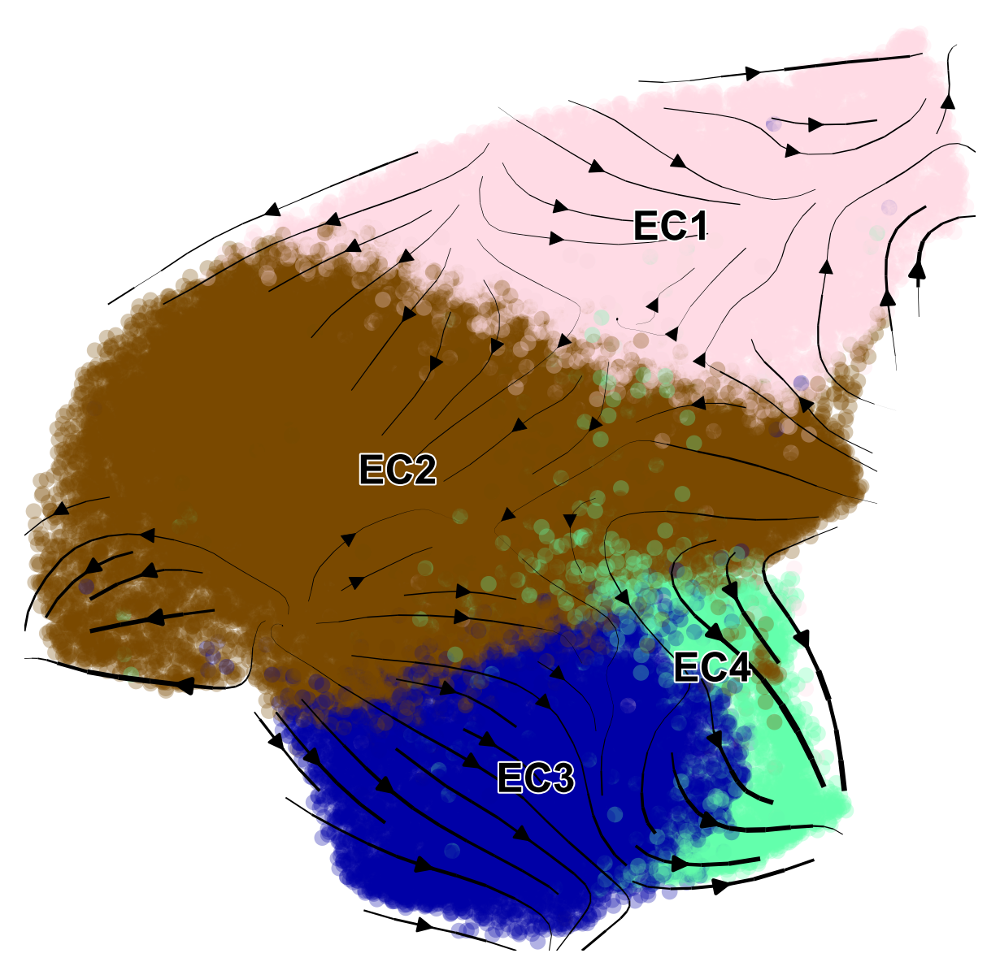

In [10]:
scv.pl.velocity_embedding_stream(ec_adata, basis='mainumap', color=['Cell_state'], title='',
                                 min_mass=0.2, density=1, 
                                 save='ec.embedding_stream.pdf', figsize=(5,5))

In [ ]:
# latent time
scv.tl.latent_time(ec_adata)

In [16]:
# pseudo time
scv.tl.velocity_pseudotime(ec_adata)

In [21]:
# save dataset
ec_adata.write('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.ec_scvelo.h5ad')

In [22]:
# reload dataset
adata = sc.read_h5ad('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.full_scvelo.h5ad')

In [23]:
# subset for CMs
cm_adata = adata[adata.obs['Cell_state'].isin(['CM1', 'CM2', 'CM3', 'CM4'])]

In [24]:
cm_adata = cm_adata[cm_adata.obs['Non_ambiguous'] == True]

In [25]:
cm_adata

View of AnnData object with n_obs × n_vars = 108846 × 32251
    obs: 'sample', 'sex', 'age', 'donor', 'group1', 'group2', 'Non_ambiguous', 'Cell_type', 'Cell_state', 'palliation', 'New_name', 'barcode', 'UMAP_1', 'UMAP_2', 'SUBUMAP_1', 'SUBUMAP_2', 'MAINUMAP_1', 'MAINUMAP_2', 'sample_batch', 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr'
    uns: 'Cell_state_colors', 'Cell_type_colors', 'neighbors'
    obsm: 'X_mainumap', 'X_pca', 'X_subumap', 'X_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


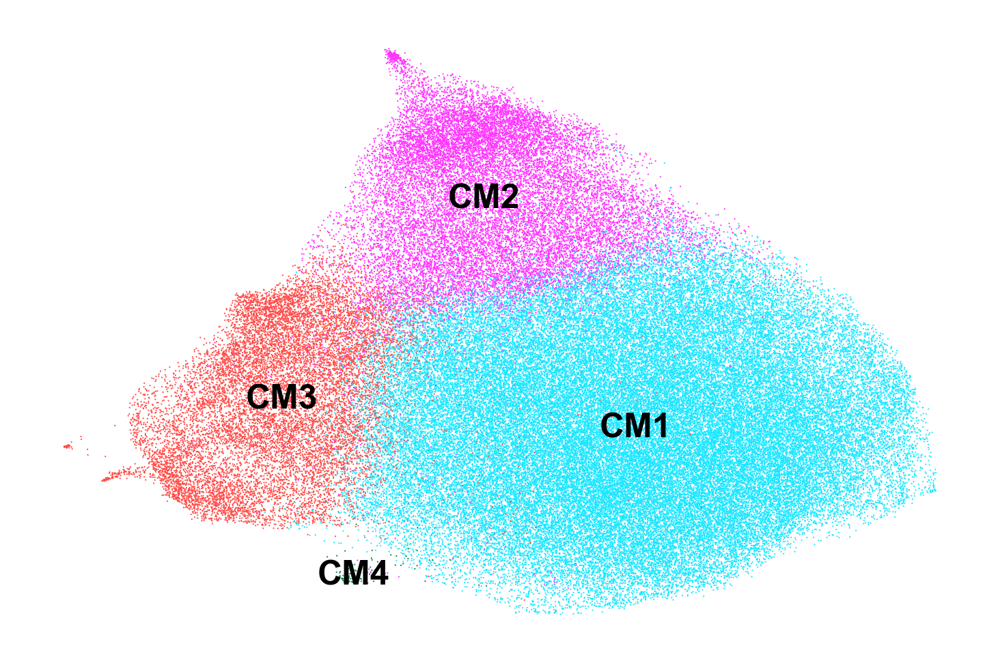

In [26]:
# check dim reduction
sc.pl.embedding(cm_adata, color='Cell_state', frameon=False, legend_loc='on data', title='', basis='subumap')

In [ ]:
# compute velocity using stochastic mode
# scv.tl.velocity(cm_adata, mode = 'stochastic')

# or
# compute velocity using dynamical mode
scv.tl.recover_dynamics(cm_adata, n_jobs = 30)
scv.tl.velocity(cm_adata, mode = 'dynamical')

In [ ]:
scv.pp.neighbors(cm_adata)
scv.tl.velocity_graph(cm_adata)

computing velocity embedding
    finished (0:00:37) --> added
    'velocity_subumap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_cm.scvelo_embedding.pdf


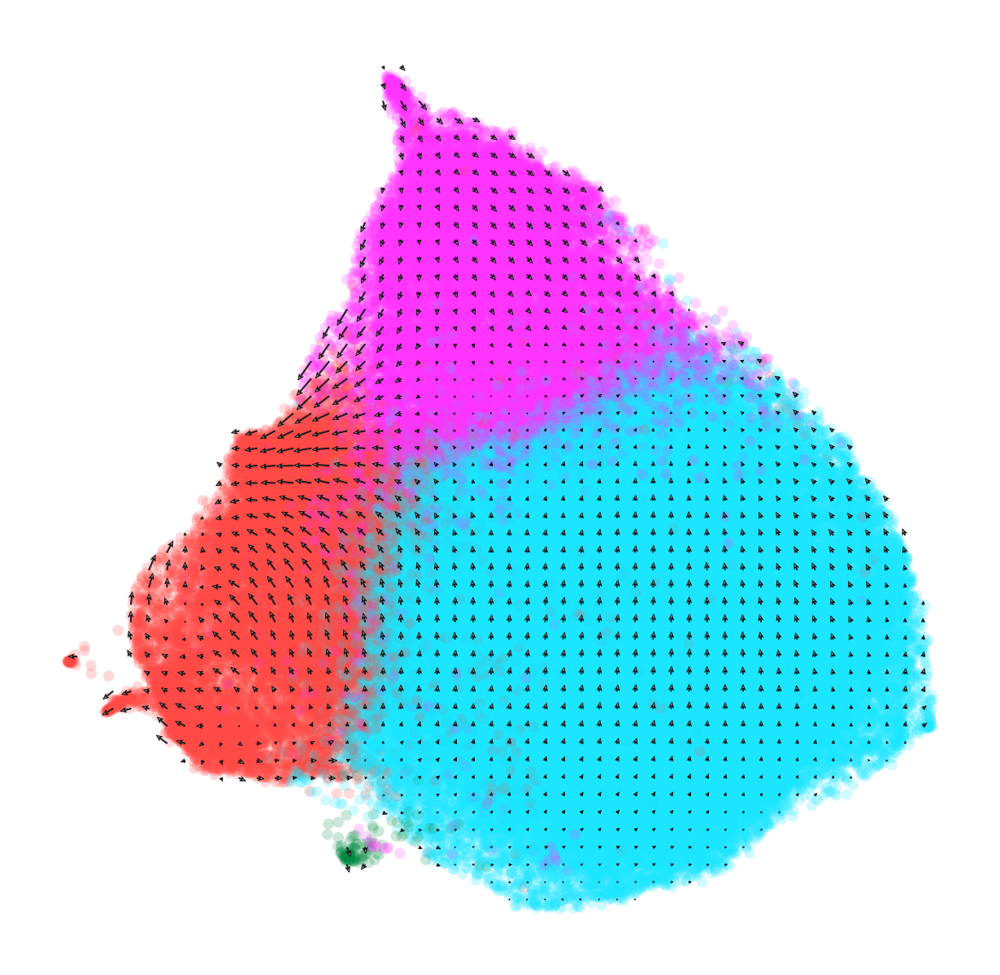

In [29]:
scv.pl.velocity_embedding_grid(cm_adata, basis='subumap', color='Cell_state', title='',
                               scale = 1, density = 1, smooth = 0.5, min_mass = 5, 
                               arrow_length = 1, arrow_size = 1, linecolor = '##000000',
                               save='cm.scvelo_embedding.pdf', figsize=(5,5))

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_cm.embedding_stream.png


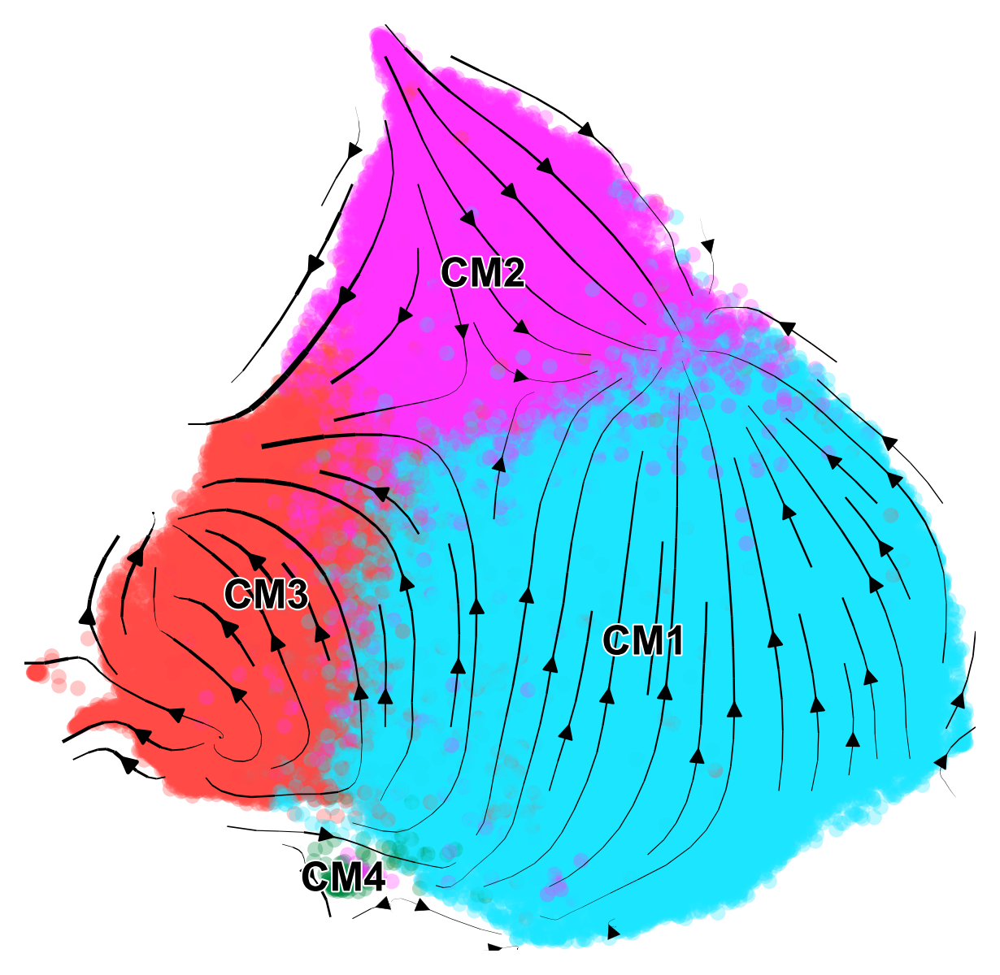

In [30]:
scv.pl.velocity_embedding_stream(cm_adata, basis='subumap', color=['Cell_state'], title='',
                                 min_mass=0.2, density=1, 
                                 save='cm.embedding_stream.pdf', figsize=(5,5))

In [35]:
# save dataset
cm_adata.write('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v2/analysis/PART24.cm_scvelo.h5ad')